In [1]:
import numpy as np
import matplotlib.pyplot as plt

import skimage.data as data
import skimage.segmentation as seg
from skimage import filters
from skimage import draw
from skimage import color
from skimage import exposure


def image_show(image, nrows=1, ncols=1, cmap='gray', **kwargs):
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 16))
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    return fig, ax

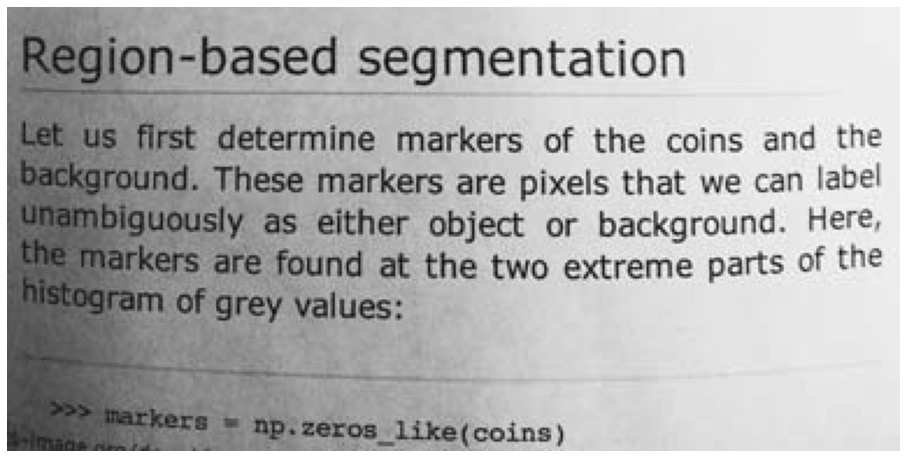

In [2]:
#It is used for seperating the region of intrest......(anything above this and anything below this is my region of intrest)
text = data.page()

image_show(text);

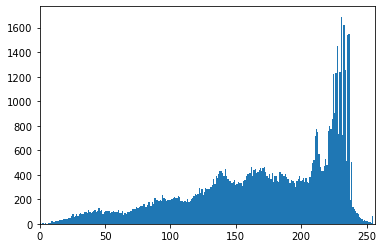

In [3]:
fig, ax = plt.subplots(1, 1)
ax.hist(text.ravel(), bins=256, range=[0, 255])
ax.set_xlim(0, 256);

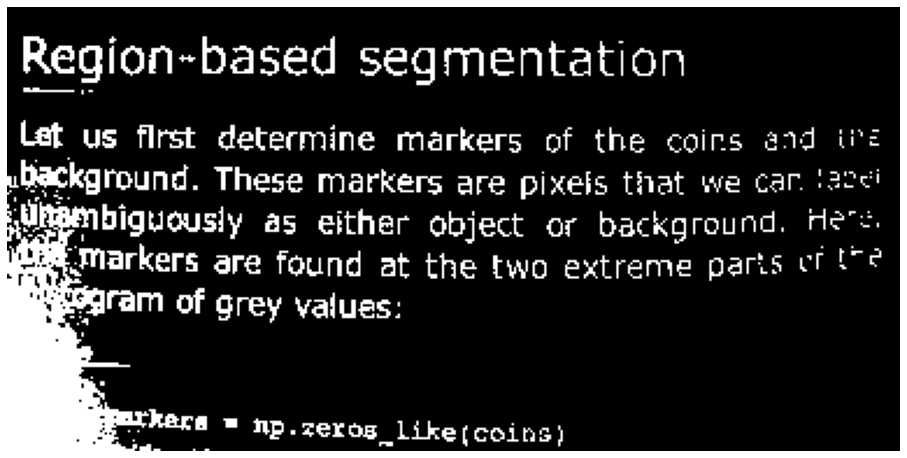

In [4]:
text_segmented = text < 100

image_show(text_segmented);

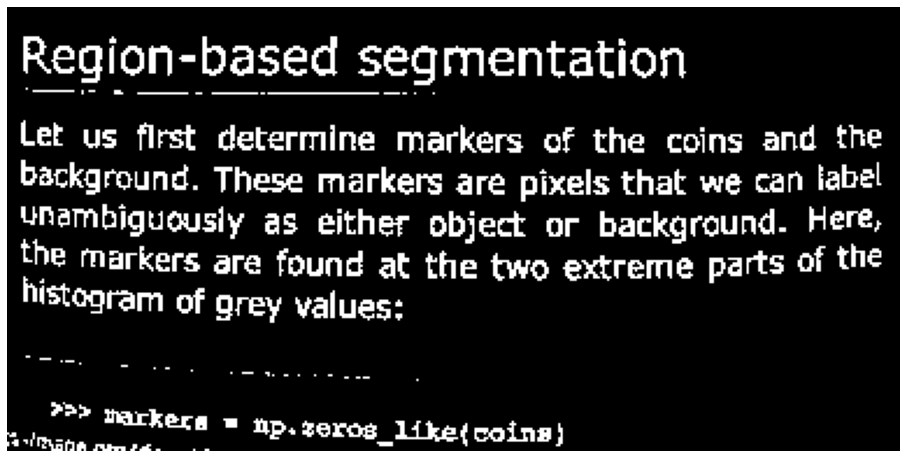

In [5]:
text_threshold = filters.threshold_sauvola(text)  # Hit tab with the cursor after the underscore, try several methods

image_show(text < text_threshold);

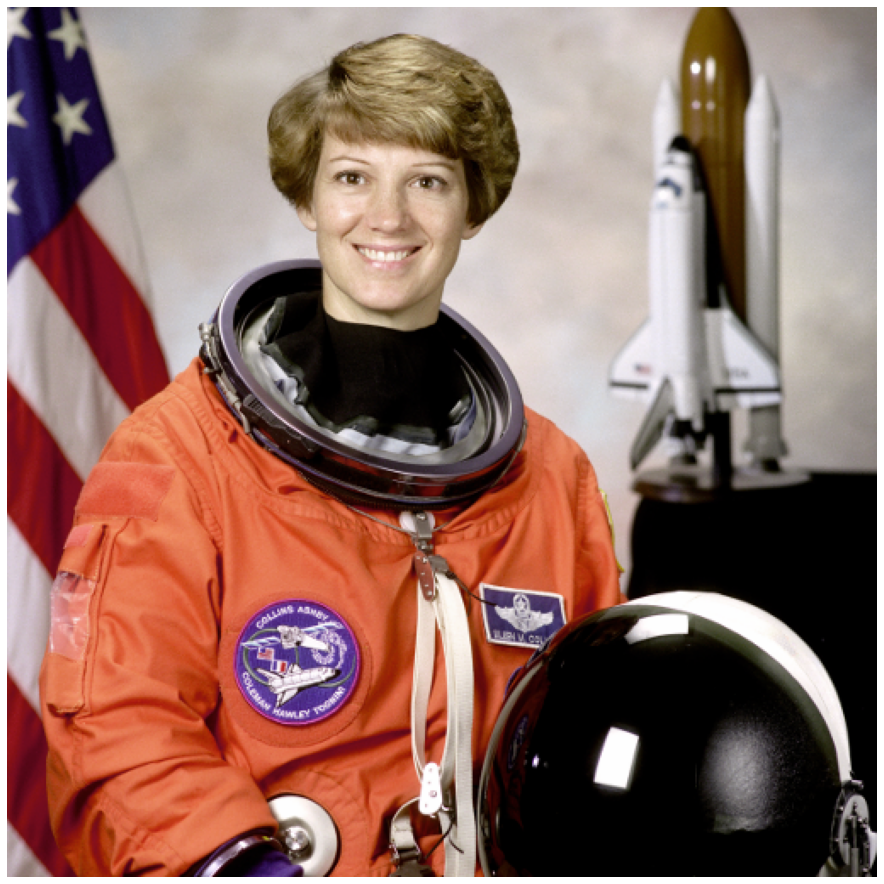

In [6]:
# Our source image
astronaut = data.astronaut()
image_show(astronaut);

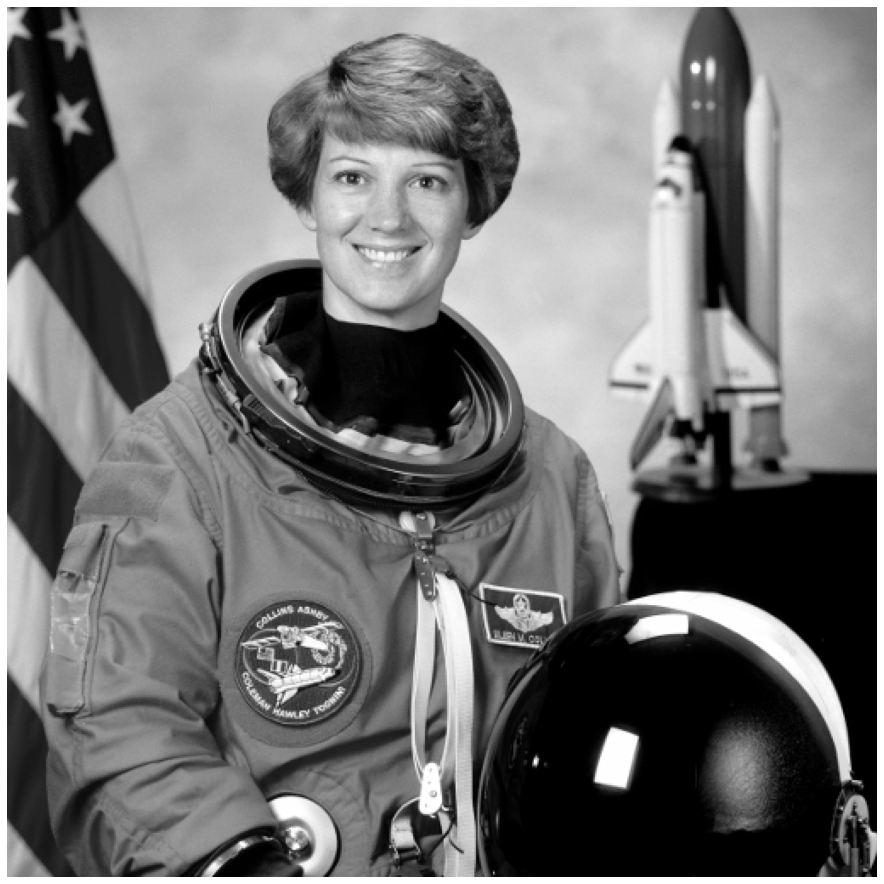

In [7]:
astronaut_gray = color.rgb2gray(astronaut)
image_show(astronaut_gray);

In [12]:
def circle_points(resolution, center, radius):
    """
    Generate points defining a circle on an image.
    """
    radians = np.linspace(0, 2*np.pi, resolution)

    c = center[1] + radius*np.cos(radians)
    r = center[0] + radius*np.sin(radians)
    
    return np.array([c, r]).T

# Exclude last point because a closed path should not have duplicate points
points = circle_points(200, [100, 220], 100)[:-1]
#snake = seg.active_contour(astronaut_gray, points, alpha= 0.1)

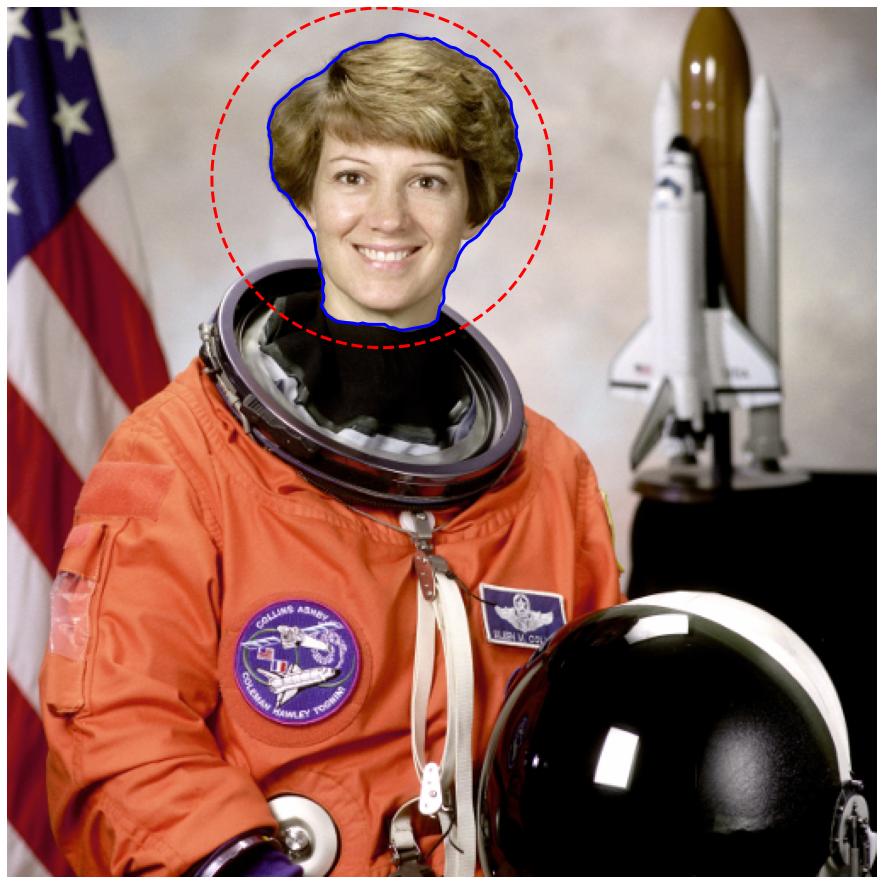

In [13]:
fig, ax = image_show(astronaut)
ax.plot(points[:, 0], points[:, 1], '--r', lw=3)
ax.plot(snake[:, 0], snake[:, 1], '-b', lw=3);

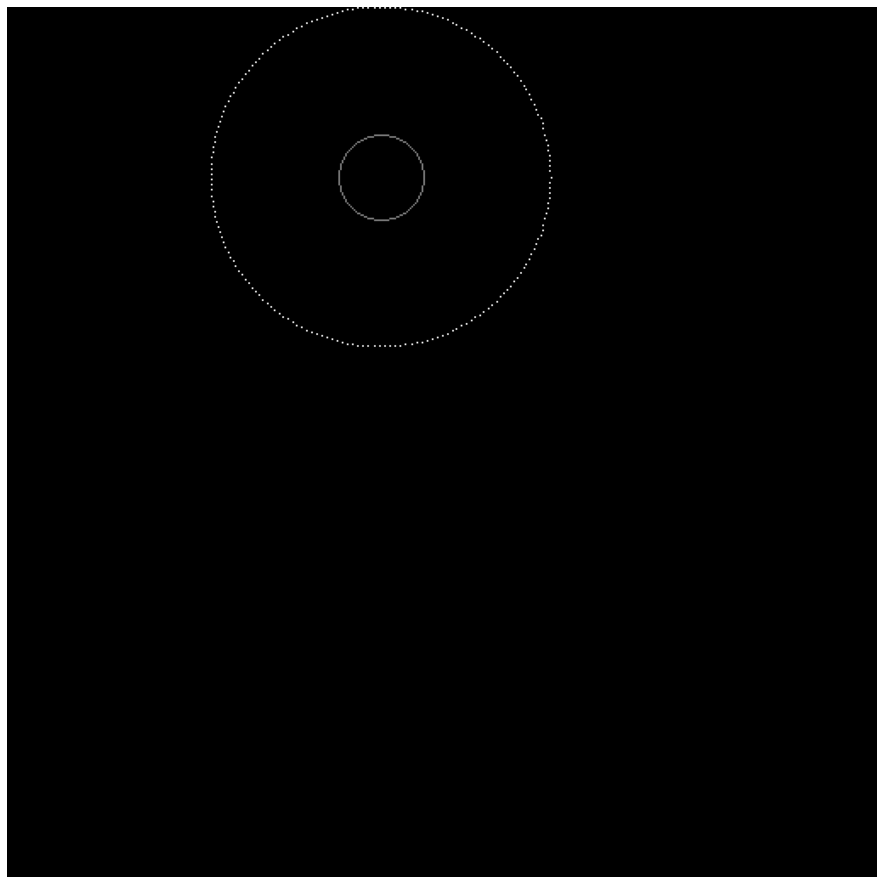

In [15]:
astronaut_labels = np.zeros(astronaut_gray.shape, dtype=np.uint8)
indices = draw.circle_perimeter(100, 220, 25)

astronaut_labels[indices] = 1
astronaut_labels[points[:, 1].astype(np.int), points[:, 0].astype(np.int)] = 2

image_show(astronaut_labels);


In [16]:
astronaut_segmented = seg.random_walker(astronaut_gray, astronaut_labels, beta=2501)


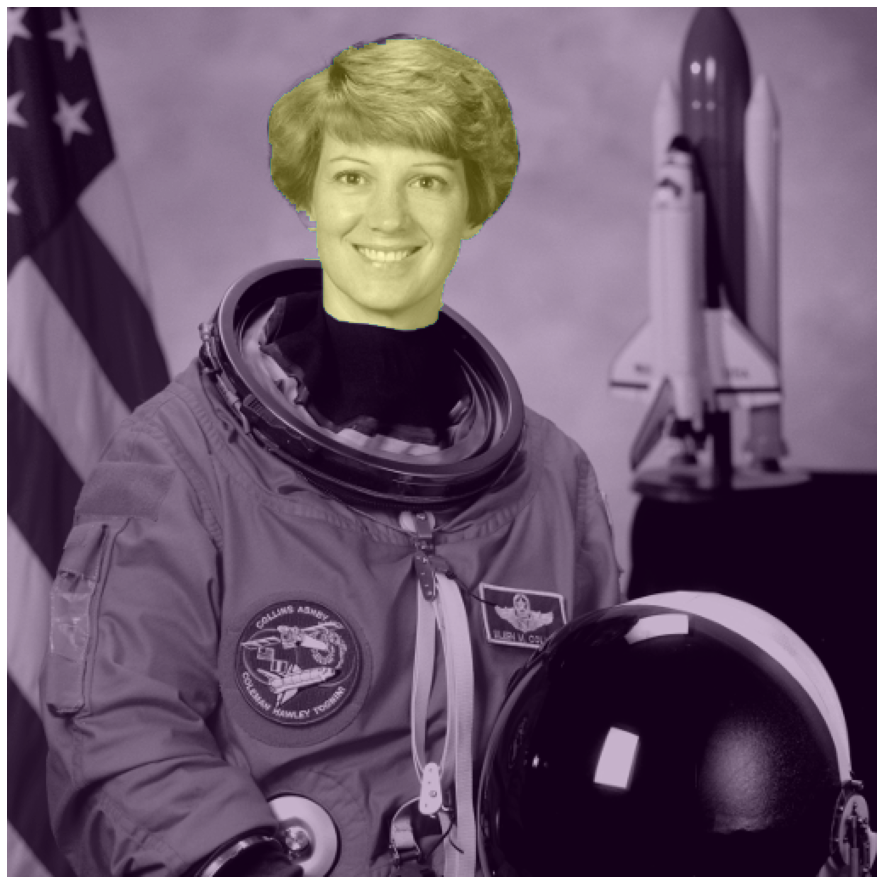

In [17]:

# Check our results
fig, ax = image_show(astronaut_gray)
ax.imshow(astronaut_segmented == 1, alpha=0.3);


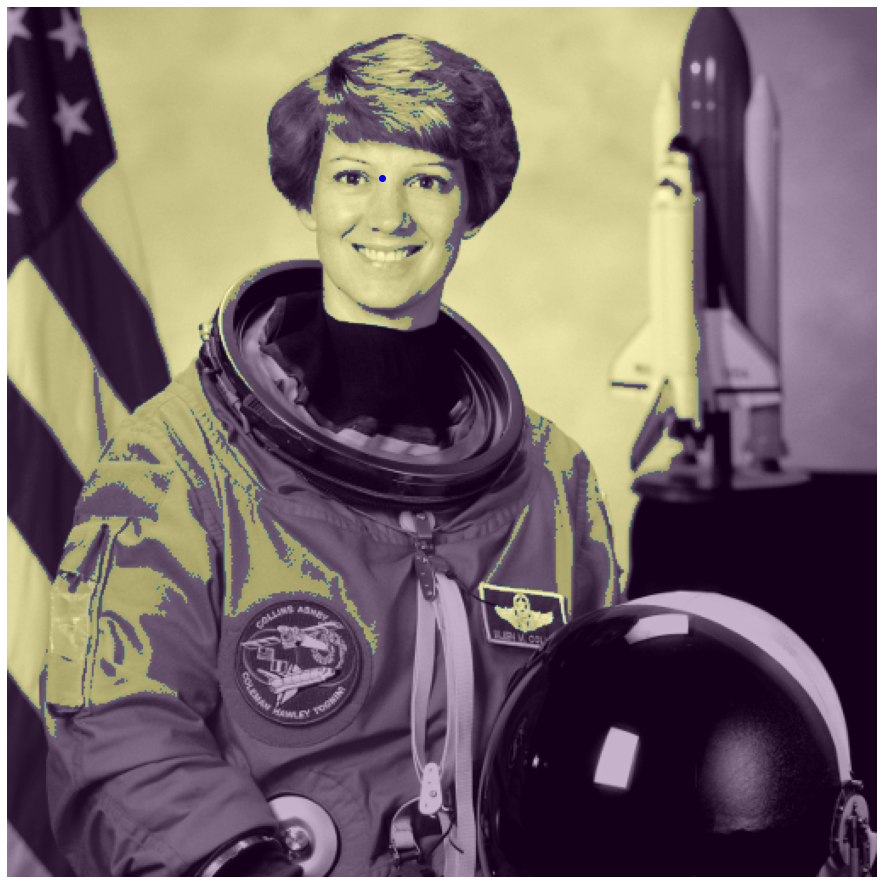

In [18]:
seed_point = (100, 220)  # Experiment with the seed point
flood_mask = seg.flood(astronaut_gray, seed_point, tolerance=0.3)  # Experiment with tolerance
fig, ax = image_show(astronaut_gray)
ax.imshow(flood_mask, alpha=0.3);
ax.plot(220, 100, 'bo')


In [19]:
seed_bkgnd = (100, 350)  # Background
seed_collar = (200, 220)  # Collar

better_contrast =   # Your idea to improve contrast here
tol_bkgnd =    # Experiment with tolerance for background
tol_collar =   # Experiment with tolerance for the collar

flood_background = seg.flood(better_contrast, seed_bkgnd, tolerance=tol_bkgnd)
flood_collar = seg.flood(better_contrast, seed_collar, tolerance=tol_collar)

SyntaxError: invalid syntax (<ipython-input-19-c6bbc97fb6d5>, line 4)

In [20]:
fig, ax = image_show(better_contrast)

# Combine the two floods with binary OR operator
ax.imshow(flood_background | flood_collar, alpha=0.3);

NameError: name 'better_contrast' is not defined

In [21]:
# SLIC works in color, so we will use the original astronaut
astronaut_slic = seg.slic(astronaut, n_segments=5000)

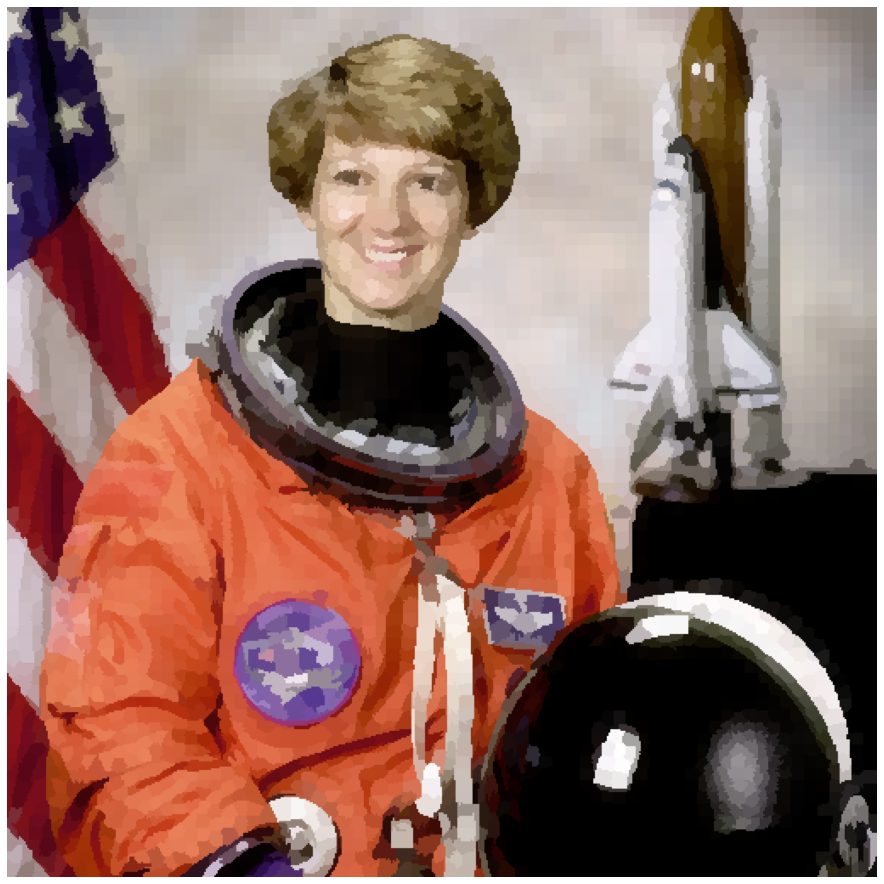

In [22]:
# label2rgb replaces each discrete label with the average interior color
image_show(color.label2rgb(astronaut_slic, astronaut, kind='avg'));

In [23]:

chan_vese = seg.chan_vese(astronaut_gray)

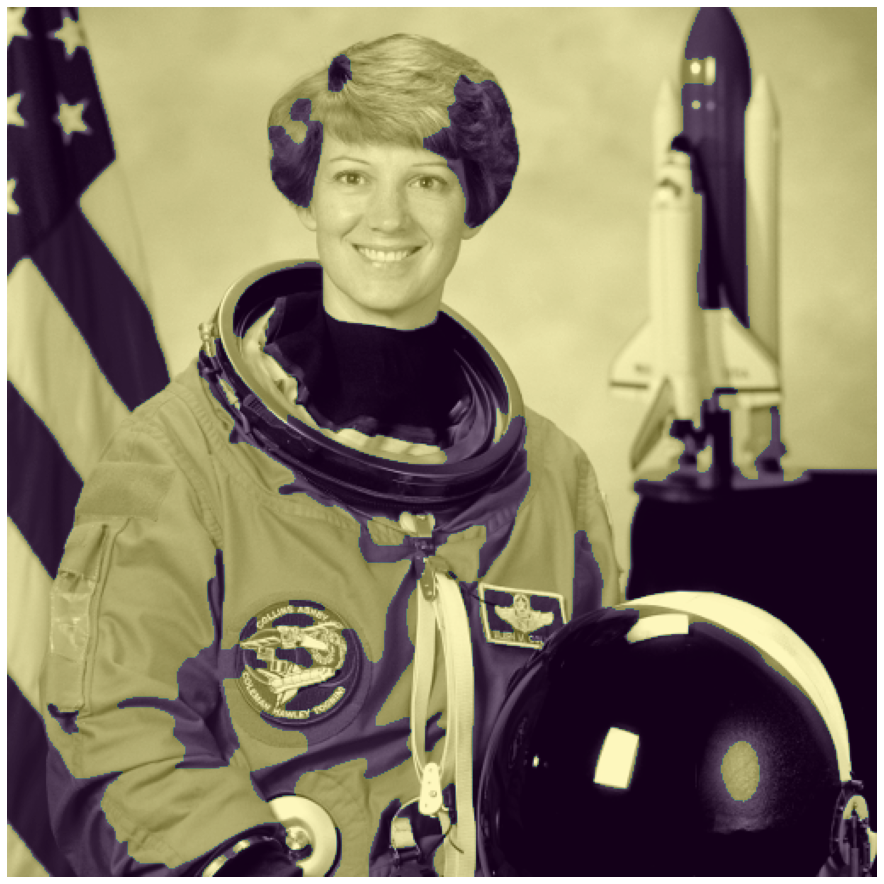

In [24]:
fig, ax = image_show(astronaut_gray)
ax.imshow(chan_vese == 0, alpha=0.3);

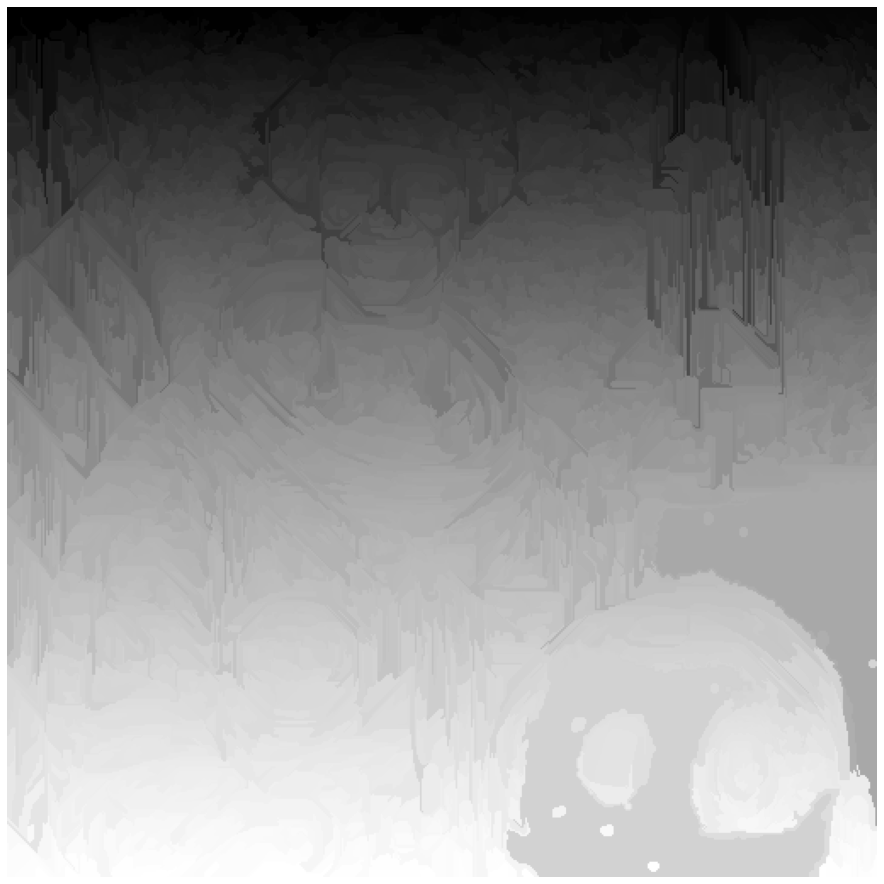

In [25]:
astronaut_felzenszwalb = seg.felzenszwalb(astronaut)  # Color required
image_show(astronaut_felzenszwalb);

In [26]:
# Find the number of unique labels
np.unique(astronaut_felzenszwalb).size

3295

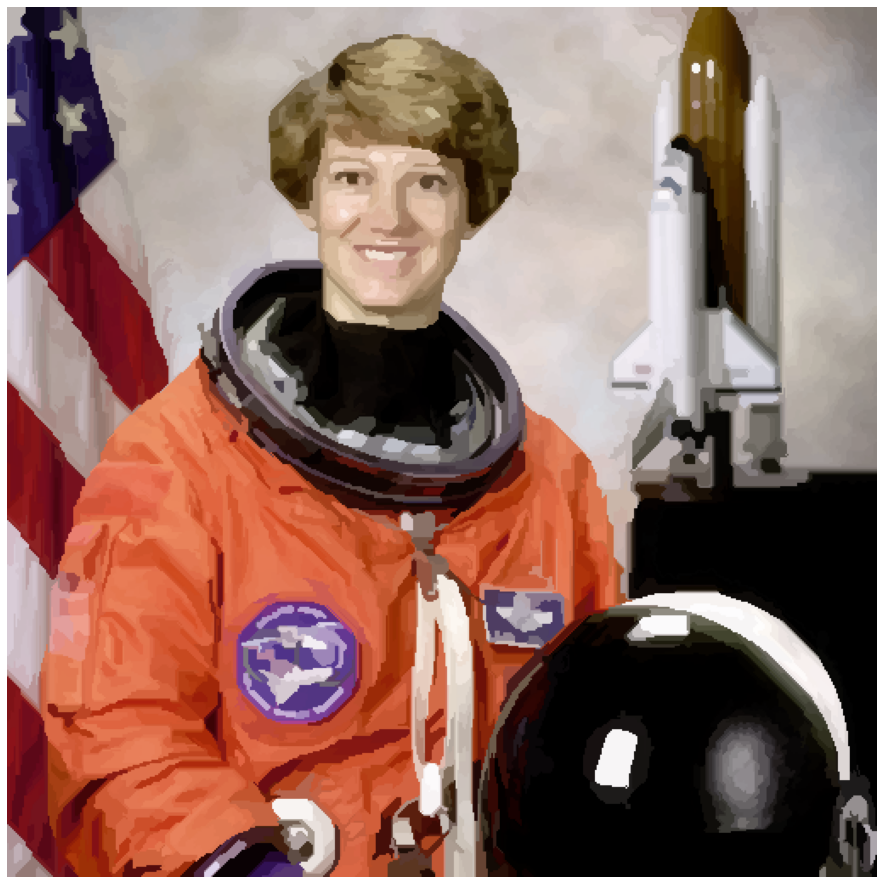

In [27]:
astronaut_felzenszwalb_colored = color.label2rgb(astronaut_felzenszwalb, astronaut, kind='avg')

image_show(astronaut_felzenszwalb_colored);

In [28]:
import skimage.future.graph as graph

rag = graph.rag_mean_color(astronaut, astronaut_felzenszwalb + 1)

In [29]:
import skimage.measure as measure

# Regionprops ignores zero, but we want to include it, so add one
regions = measure.regionprops(astronaut_felzenszwalb + 1)  

# Pass centroid data into the graph
for region in regions:
    rag.nodes[region['label']]['centroid'] = region['centroid']

In [30]:

def display_edges(image, g, threshold):
    """Draw edges of a RAG on its image
 
    Returns a modified image with the edges drawn.Edges are drawn in green
    and nodes are drawn in yellow.
 
    Parameters
    ----------
    image : ndarray
        The image to be drawn on.
    g : RAG
        The Region Adjacency Graph.
    threshold : float
        Only edges in `g` below `threshold` are drawn.
 
    Returns:
    out: ndarray
        Image with the edges drawn.
    """
    image = image.copy()
    for edge in g.edges():
        n1, n2 = edge
 
        r1, c1 = map(int, rag.nodes[n1]['centroid'])
        r2, c2 = map(int, rag.nodes[n2]['centroid'])
 
        line  = draw.line(r1, c1, r2, c2)
        circle = draw.circle(r1,c1,2)
 
        if g[n1][n2]['weight'] < threshold :
            image[line] = 0,255,0
        image[circle] = 255,255,0
 
    return image

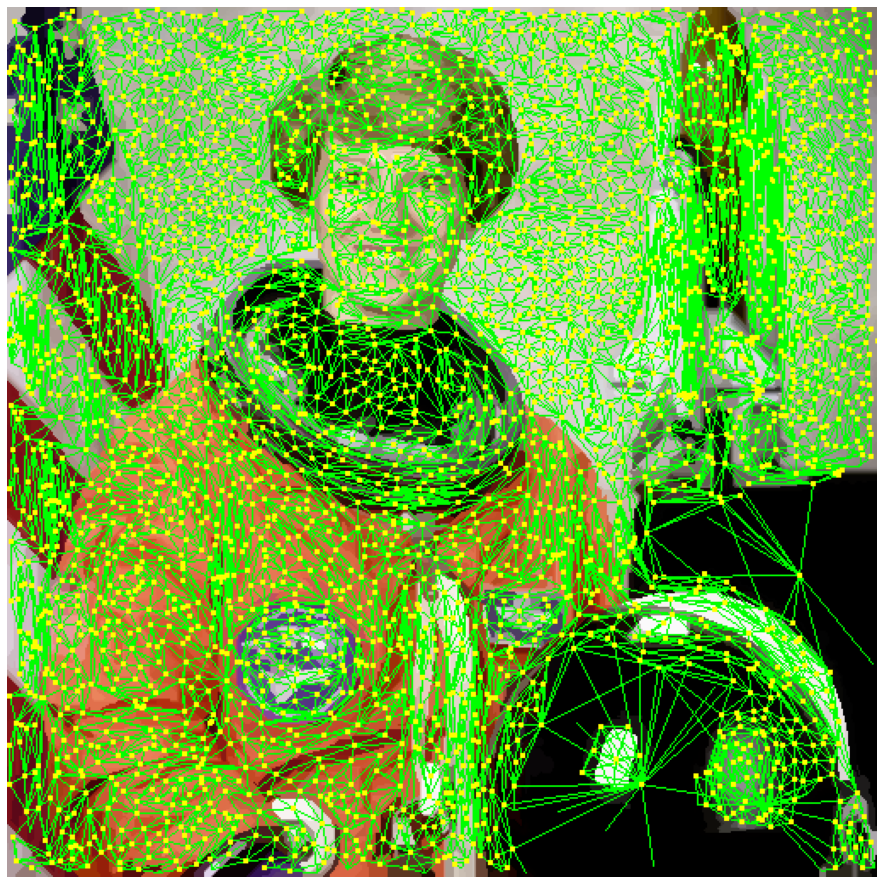

In [31]:
# All edges are drawn with threshold at infinity
edges_drawn_all = display_edges(astronaut_felzenszwalb_colored, rag, np.inf)
image_show(edges_drawn_all);
#In its output yellow dots are the centre of sub regions and green lines are showing us what are they adjecent to

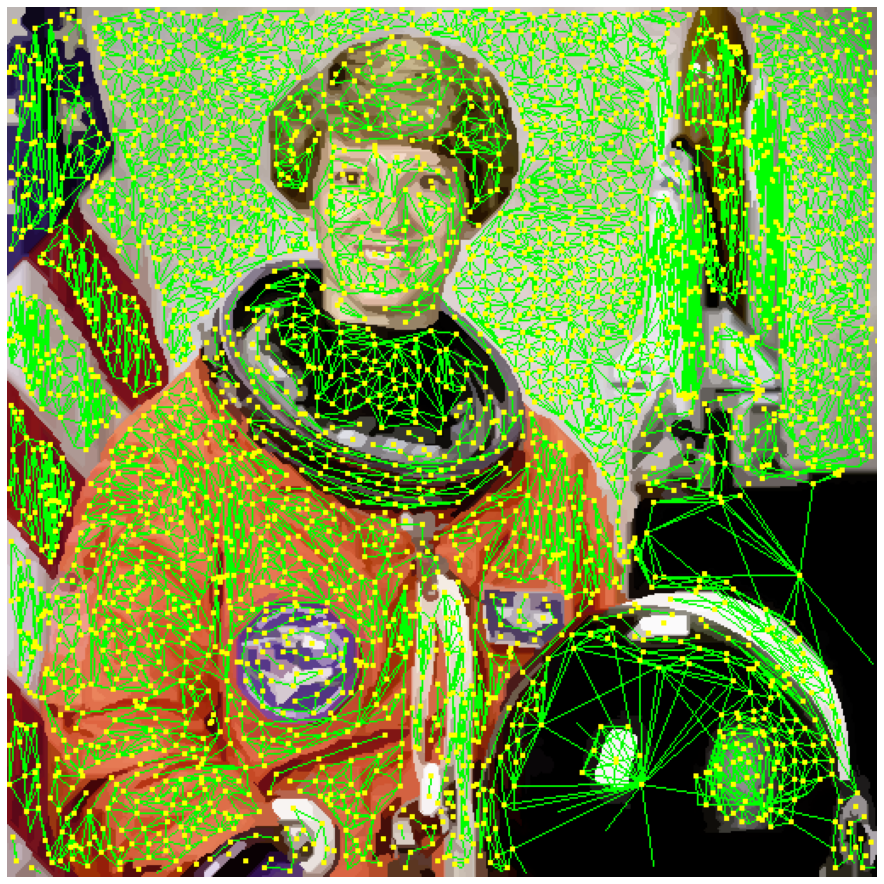

In [32]:
threshold = 50 # Experiment

edges_drawn_few = display_edges(astronaut_felzenszwalb_colored, rag, threshold)
image_show(edges_drawn_few);

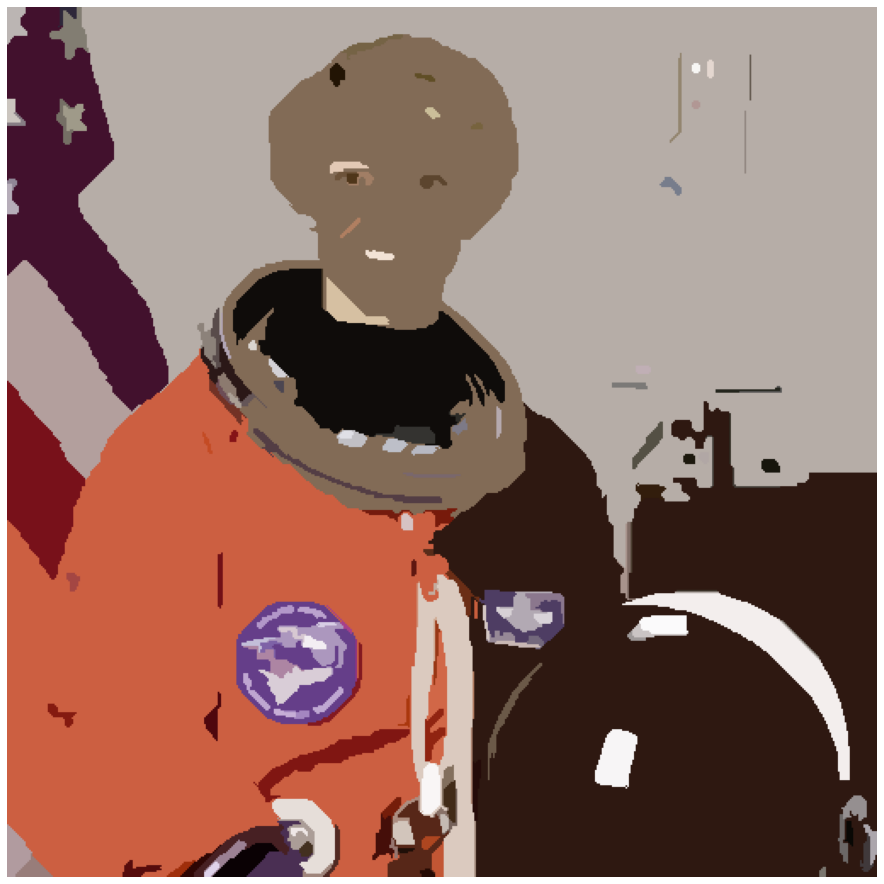

In [33]:
final_labels = graph.cut_threshold(astronaut_felzenszwalb + 1, rag, threshold)
final_label_rgb = color.label2rgb(final_labels, astronaut, kind='avg')

image_show(final_label_rgb);

In [35]:
np.unique(final_labels).size

176

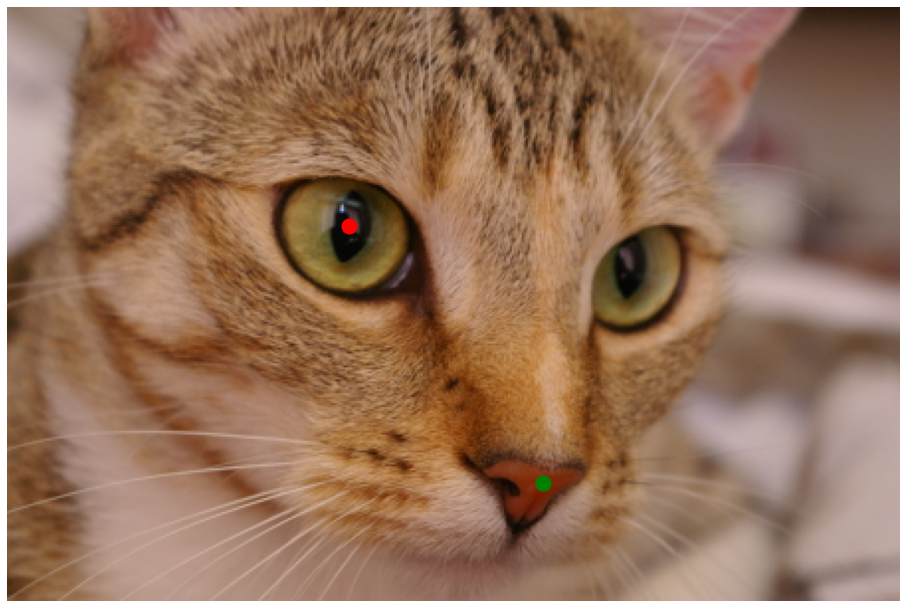

In [36]:
#EXERCISE

fig, ax = image_show(data.chelsea())

ax.plot(270, 240, marker='o', markersize=15, color="g")
ax.plot(172, 110, marker='o', markersize=15, color="r");